In [38]:
import os
import cv2  
import pandas as pd 
from pathlib import Path
import multiprocessing as mp
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [2]:
input_path = Path('../data')
train_path = input_path / 'trainsamples'
test_path = input_path / 'test'

In [3]:
cameras = os.listdir(train_path)

train_images = []
for camera in cameras:
    for fname in sorted(os.listdir(train_path / camera)):
        train_images.append((camera, fname))

train = pd.DataFrame(train_images, columns=['camera', 'fname'])
print(train.shape)
train.sample(5)

(100, 2)


,camera,fname
88,Samsung-Galaxy-S4,(GalaxyS4)8.jpg
53,Motorola-Nexus-6,(MotoNex6)3.jpg
42,Motorola-Droid-Maxx,(MotoMax)2.jpg
35,LG-Nexus-5x,(LG5x)5.jpg
90,Sony-NEX-7,(Nex7)1.JPG


In [4]:
test_images = []
for fname in sorted(os.listdir(test_path)):
    test_images.append(fname)

test = pd.DataFrame(test_images, columns=['fname'])
print(test.shape)
test.head(5)

(2640, 1)


,fname
0,img_0002a04_manip.tif
1,img_001e31c_unalt.tif
2,img_00275cf_manip.tif
3,img_0034113_unalt.tif
4,img_00344b7_unalt.tif


../data/trainsamples/HTC-1-M7/(HTC-1-M7)1.jpg  :  583.018767861  :  7.61357231079


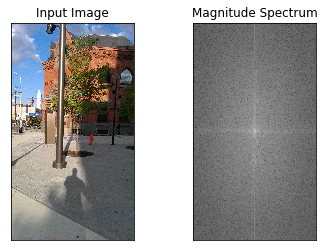

../data/trainsamples/HTC-1-M7/(HTC-1-M7)10.jpg  :  366.99708911  :  7.63382906631


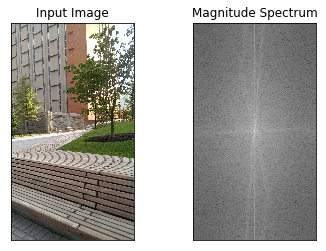

../data/trainsamples/HTC-1-M7/(HTC-1-M7)2.jpg  :  393.722811668  :  7.56050259533


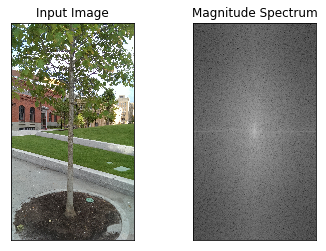

../data/trainsamples/HTC-1-M7/(HTC-1-M7)3.jpg  :  530.623999503  :  7.33049942095


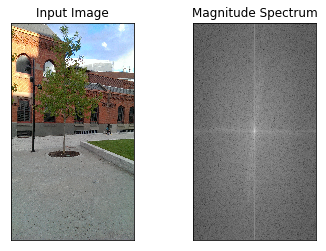

../data/trainsamples/HTC-1-M7/(HTC-1-M7)4.jpg  :  379.688829495  :  7.56188377779


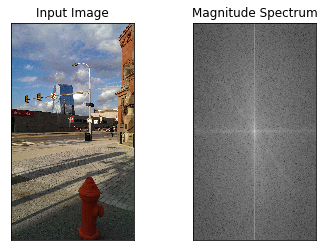

../data/trainsamples/HTC-1-M7/(HTC-1-M7)5.jpg  :  351.464028399  :  7.38861145886


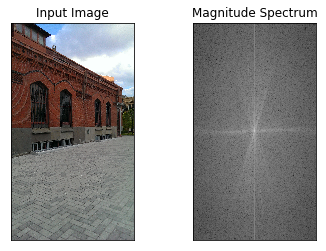

../data/trainsamples/HTC-1-M7/(HTC-1-M7)6.jpg  :  371.914498397  :  7.33053184898


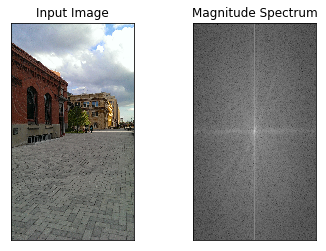

../data/trainsamples/HTC-1-M7/(HTC-1-M7)7.jpg  :  1063.92644087  :  7.42950078265


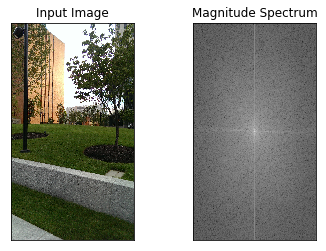

../data/trainsamples/HTC-1-M7/(HTC-1-M7)8.jpg  :  386.979282924  :  7.62494078142


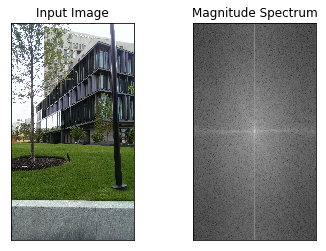

../data/trainsamples/HTC-1-M7/(HTC-1-M7)9.jpg  :  488.001936131  :  7.47568076428


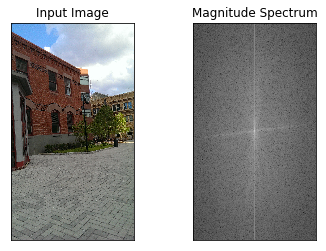

../data/trainsamples/iPhone-4s/(iP4s)1.jpg  :  292.647396234  :  7.24120377524


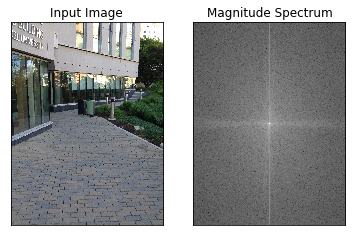

../data/trainsamples/iPhone-4s/(iP4s)10.jpg  :  364.420259269  :  7.07276496896


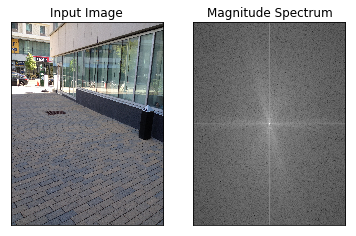

../data/trainsamples/iPhone-4s/(iP4s)2.jpg  :  560.949343456  :  7.33786123032


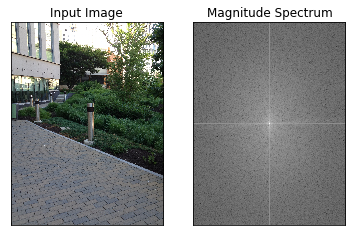

../data/trainsamples/iPhone-4s/(iP4s)3.jpg  :  719.939218625  :  7.53365656046


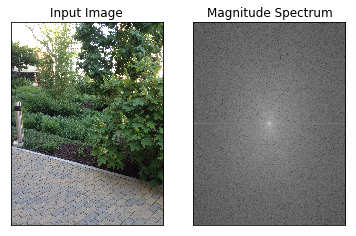

../data/trainsamples/iPhone-4s/(iP4s)4.jpg  :  464.063686885  :  7.46803477118


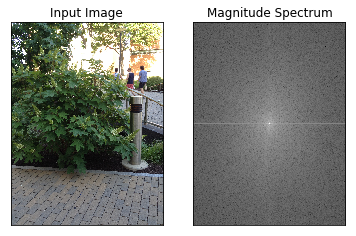

../data/trainsamples/iPhone-4s/(iP4s)5.jpg  :  621.492685757  :  7.32121066341


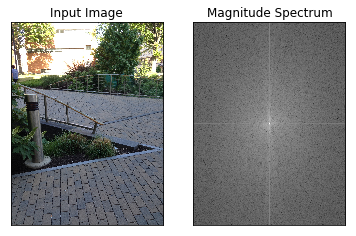

../data/trainsamples/iPhone-4s/(iP4s)6.jpg  :  526.965807416  :  7.23375977411


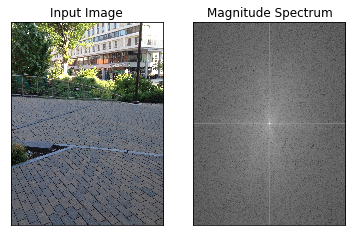

../data/trainsamples/iPhone-4s/(iP4s)7.jpg  :  635.445532375  :  7.01123836009


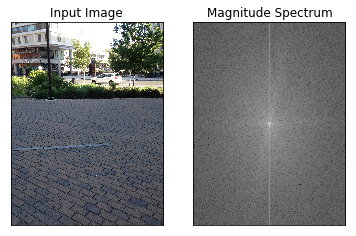

../data/trainsamples/iPhone-4s/(iP4s)8.jpg  :  597.310340123  :  7.08114816954


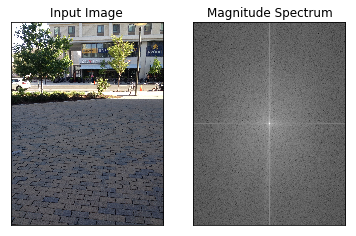

../data/trainsamples/iPhone-4s/(iP4s)9.jpg  :  433.141792291  :  7.00425313074


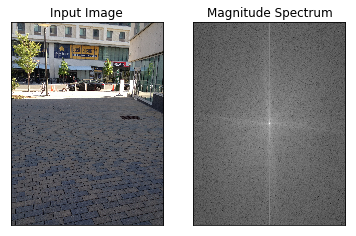

../data/trainsamples/iPhone-6/(iP6)1.jpg  :  146.36430502  :  7.30958849818


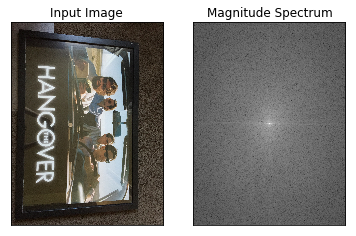

../data/trainsamples/iPhone-6/(iP6)10.jpg  :  164.124903374  :  7.35604805957


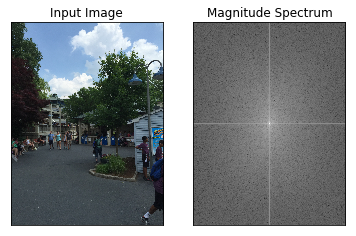

../data/trainsamples/iPhone-6/(iP6)2.jpg  :  61.232995821  :  7.26791083265


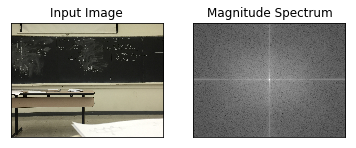

../data/trainsamples/iPhone-6/(iP6)3.jpg  :  653.408401956  :  7.43822226743


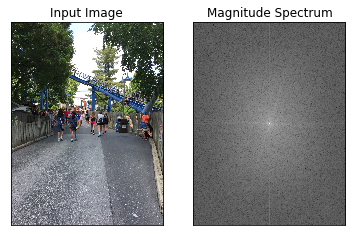

../data/trainsamples/iPhone-6/(iP6)4.jpg  :  369.839399325  :  7.4548647113


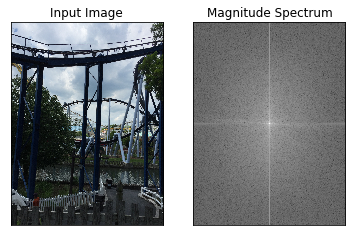

../data/trainsamples/iPhone-6/(iP6)5.jpg  :  313.86673182  :  7.37434853239


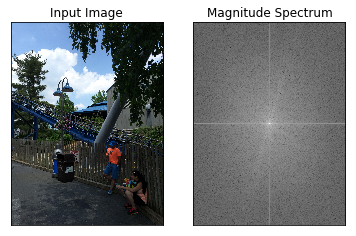

../data/trainsamples/iPhone-6/(iP6)6.jpg  :  474.9620432  :  7.22433157267


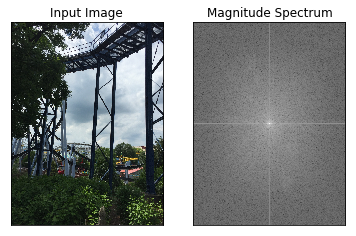

../data/trainsamples/iPhone-6/(iP6)7.jpg  :  480.958756782  :  7.81353496252


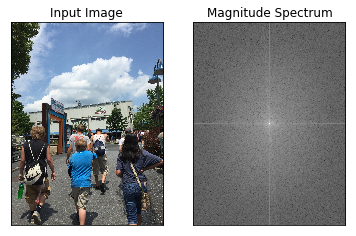

../data/trainsamples/iPhone-6/(iP6)8.jpg  :  512.080308747  :  7.62994178072


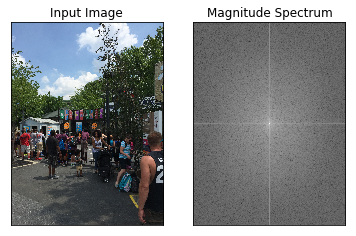

../data/trainsamples/iPhone-6/(iP6)9.jpg  :  704.579234306  :  7.39619381795


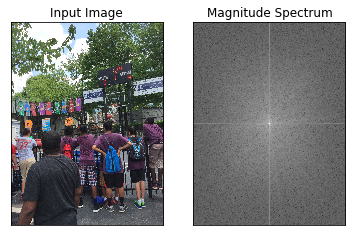

../data/trainsamples/LG-Nexus-5x/(LG5x)1.jpg  :  299.776204371  :  7.40345691558


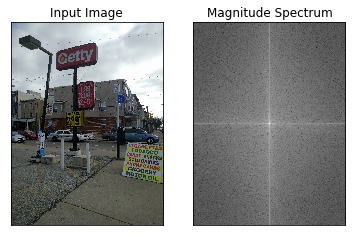

../data/trainsamples/LG-Nexus-5x/(LG5x)10.jpg  :  181.916445388  :  7.27951835434


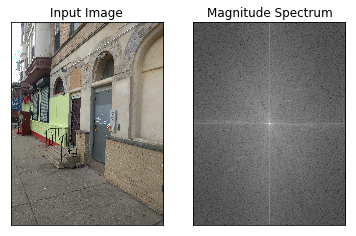

../data/trainsamples/LG-Nexus-5x/(LG5x)2.jpg  :  69.1870170908  :  7.17064456937


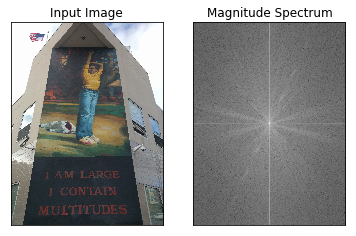

../data/trainsamples/LG-Nexus-5x/(LG5x)3.jpg  :  324.241625724  :  7.63328816226


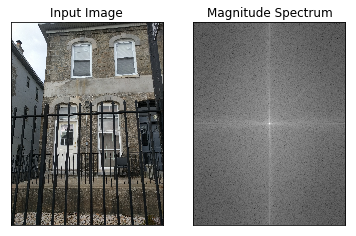

../data/trainsamples/LG-Nexus-5x/(LG5x)4.jpg  :  210.406721072  :  7.48609483378


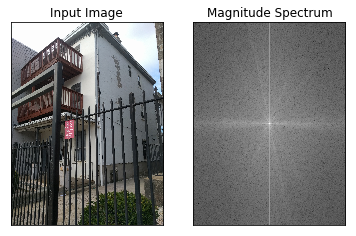

../data/trainsamples/LG-Nexus-5x/(LG5x)5.jpg  :  363.950351714  :  7.32921164818


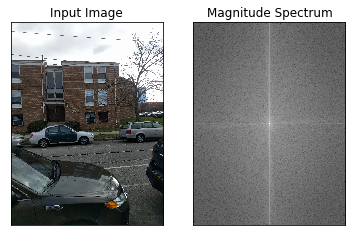

../data/trainsamples/LG-Nexus-5x/(LG5x)6.jpg  :  266.118151798  :  7.52488505621


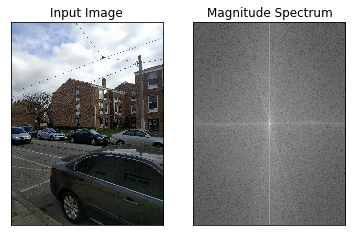

../data/trainsamples/LG-Nexus-5x/(LG5x)7.jpg  :  211.585758048  :  6.50430848998


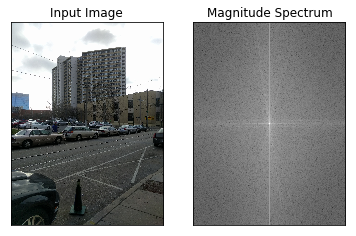

../data/trainsamples/LG-Nexus-5x/(LG5x)8.jpg  :  198.673257922  :  6.85917244592


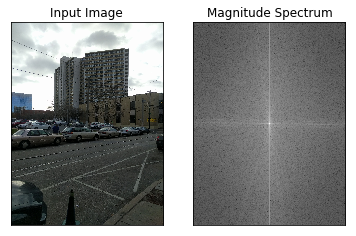

../data/trainsamples/LG-Nexus-5x/(LG5x)9.jpg  :  57.5271572458  :  7.20606867732


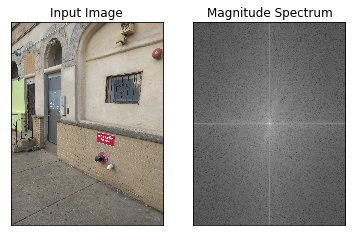

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)1.jpg  :  97.1270708126  :  7.79525646073


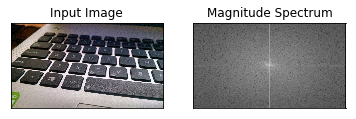

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)10.jpg  :  67.2013662176  :  7.60839593221


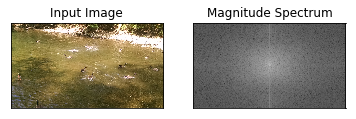

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)2.jpg  :  148.591627166  :  7.74941064109


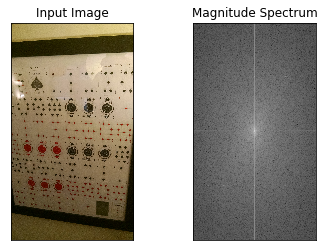

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)3.jpg  :  251.525130969  :  7.87587782561


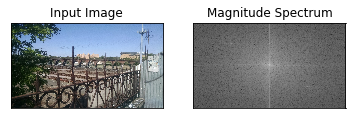

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)4.jpg  :  48.3417812396  :  7.5709962373


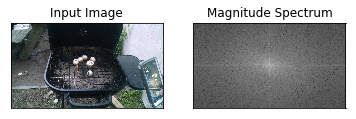

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)5.jpg  :  130.00390406  :  7.13719933081


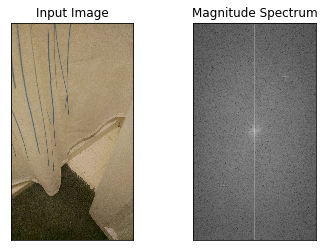

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)6.jpg  :  914.136306079  :  7.64475016525


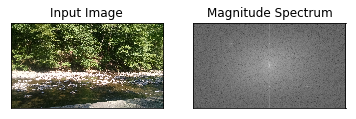

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)7.jpg  :  471.753768832  :  6.56091960014


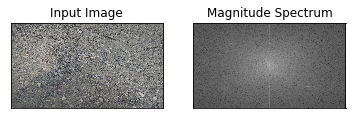

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)8.jpg  :  538.220141283  :  6.90503470051


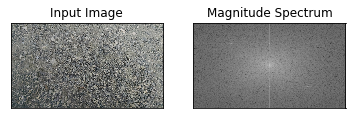

../data/trainsamples/Motorola-Droid-Maxx/(MotoMax)9.jpg  :  251.533117502  :  7.47802607091


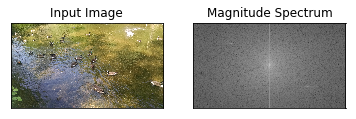

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)1.jpg  :  167.99498378  :  7.88501481024


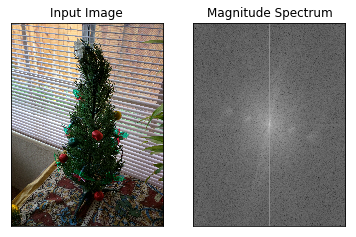

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)10.jpg  :  100.744123902  :  7.66740113833


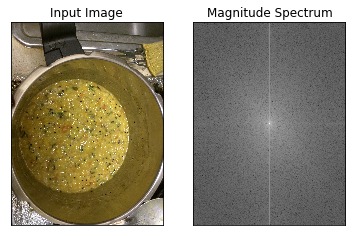

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)2.jpg  :  113.880131113  :  7.58279680448


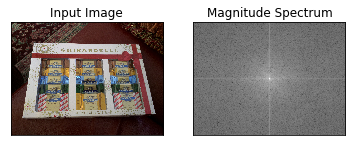

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)3.jpg  :  15.2485471366  :  7.47841216063


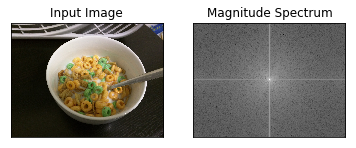

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)4.jpg  :  67.5469384065  :  7.42755647029


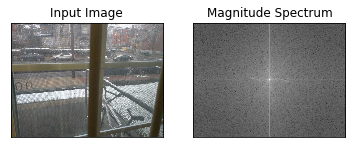

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)5.jpg  :  7.26214147373  :  7.40132240944


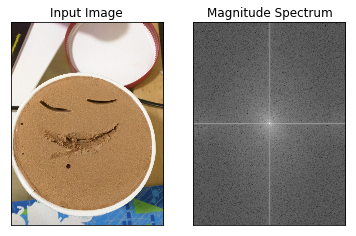

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)6.jpg  :  39.5075031454  :  7.7727077822


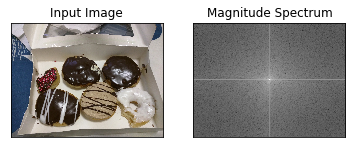

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)7.jpg  :  31.8798868951  :  7.61314746572


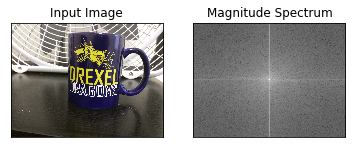

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)8.jpg  :  214.851576442  :  7.03795566913


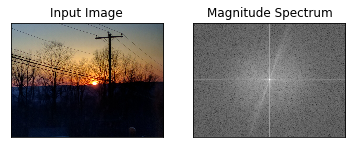

../data/trainsamples/Motorola-Nexus-6/(MotoNex6)9.jpg  :  257.089591808  :  7.63162827282


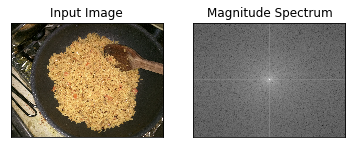

../data/trainsamples/Motorola-X/(MotoX)1.jpg  :  249.845216229  :  7.71568999777


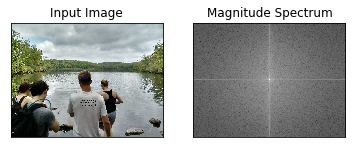

../data/trainsamples/Motorola-X/(MotoX)10.jpg  :  25.5116995652  :  7.69608110635


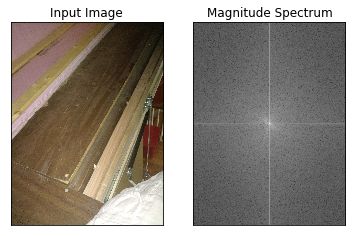

../data/trainsamples/Motorola-X/(MotoX)2.jpg  :  383.360057387  :  7.81881528578


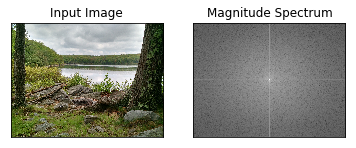

../data/trainsamples/Motorola-X/(MotoX)3.jpg  :  238.649381332  :  7.76043934439


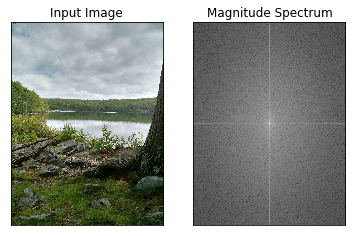

../data/trainsamples/Motorola-X/(MotoX)4.jpg  :  138.972187269  :  7.57476024667


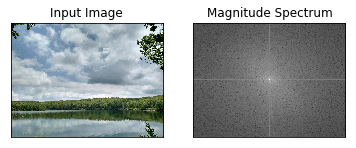

../data/trainsamples/Motorola-X/(MotoX)5.jpg  :  2000.36050417  :  7.73664321433


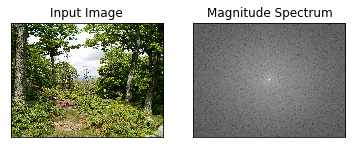

../data/trainsamples/Motorola-X/(MotoX)6.jpg  :  960.537332516  :  7.74445347437


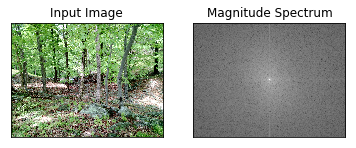

../data/trainsamples/Motorola-X/(MotoX)7.jpg  :  290.892435198  :  7.852054976


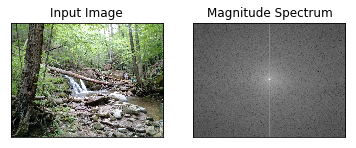

../data/trainsamples/Motorola-X/(MotoX)8.jpg  :  464.877885635  :  7.35752634713


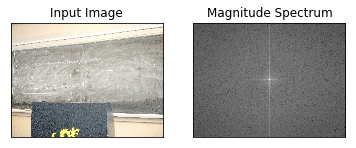

../data/trainsamples/Motorola-X/(MotoX)9.jpg  :  46.4747858109  :  7.08016102322


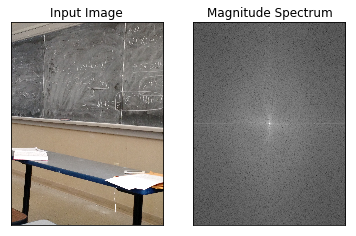

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)1.jpg  :  571.901996953  :  7.35430344463


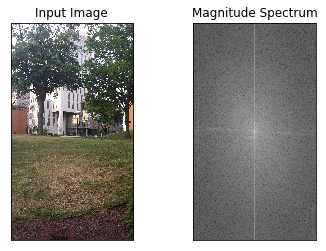

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)10.jpg  :  188.25765918  :  6.38233033615


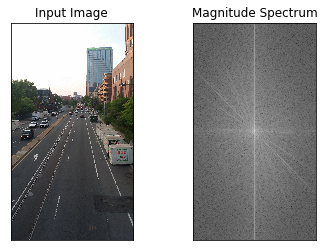

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)2.jpg  :  26.4750088833  :  7.01358388928


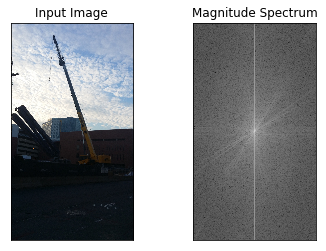

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)3.jpg  :  169.76430326  :  7.57973183689


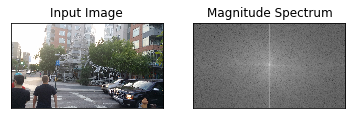

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)4.jpg  :  44.3275484536  :  7.3676141376


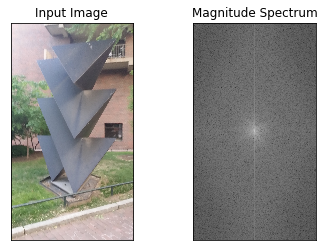

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)5.jpg  :  155.157613914  :  7.49535199495


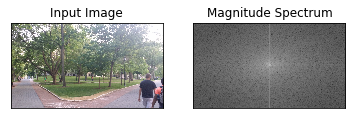

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)6.jpg  :  348.750387845  :  7.47782449061


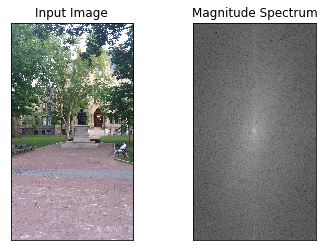

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)7.jpg  :  221.430753585  :  7.42276298527


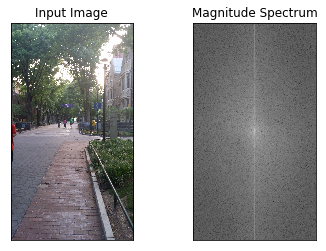

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)8.jpg  :  244.413821124  :  6.68571532954


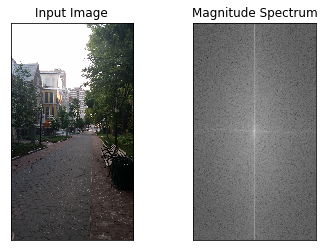

../data/trainsamples/Samsung-Galaxy-Note3/(GalaxyN3)9.jpg  :  143.25462733  :  7.43499831517


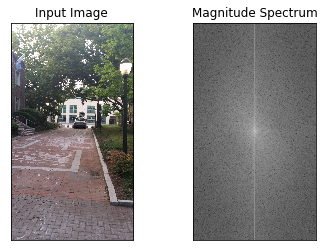

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)1.jpg  :  36.9495551089  :  7.2180555149


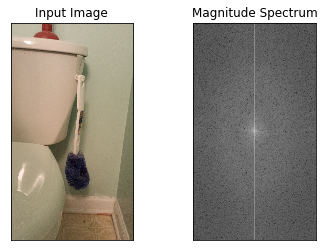

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)10.jpg  :  76.6147549456  :  7.50018536421


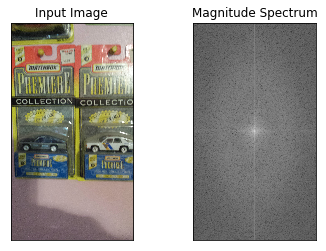

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)2.jpg  :  24.6964079889  :  7.02033937046


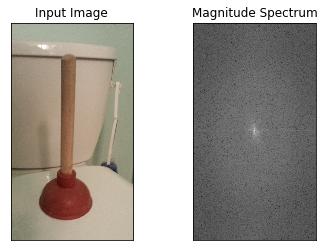

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)3.jpg  :  20.5217333595  :  7.1142795396


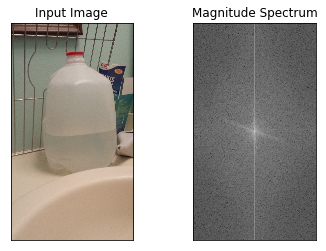

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)4.jpg  :  18.97719798  :  7.74226911748


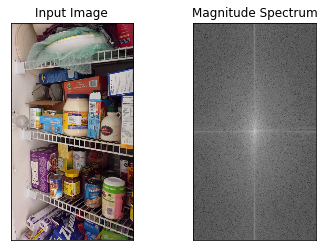

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)5.jpg  :  103.914023311  :  7.76778827986


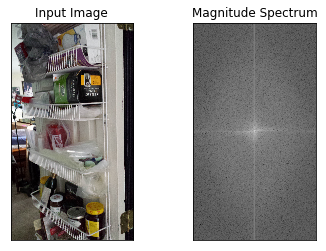

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)6.jpg  :  94.2323356978  :  7.6946050357


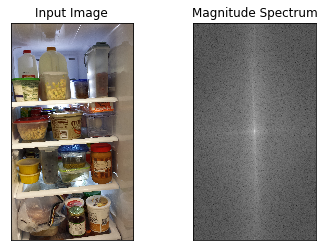

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)7.jpg  :  930.238681083  :  7.5953931315


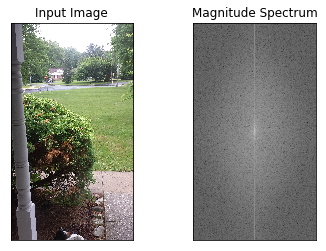

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)8.jpg  :  521.529788677  :  7.59342131889


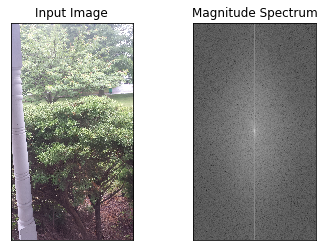

../data/trainsamples/Samsung-Galaxy-S4/(GalaxyS4)9.jpg  :  10.7201687487  :  7.71717501101


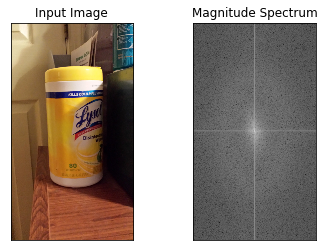

../data/trainsamples/Sony-NEX-7/(Nex7)1.JPG  :  50.7442754133  :  6.01395659093


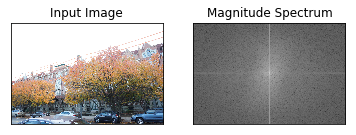

../data/trainsamples/Sony-NEX-7/(Nex7)10.JPG  :  283.053464924  :  7.61238710843


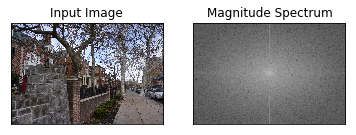

../data/trainsamples/Sony-NEX-7/(Nex7)2.JPG  :  72.0666936799  :  7.5862150604


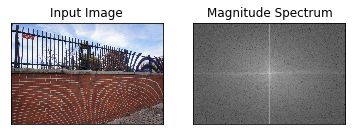

../data/trainsamples/Sony-NEX-7/(Nex7)3.JPG  :  101.245767374  :  7.07324517711


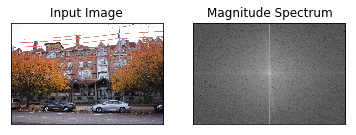

../data/trainsamples/Sony-NEX-7/(Nex7)4.JPG  :  81.5642621717  :  7.40091674105


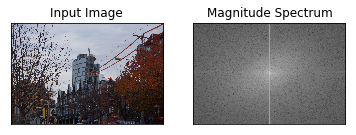

../data/trainsamples/Sony-NEX-7/(Nex7)5.JPG  :  137.648510792  :  7.54790046409


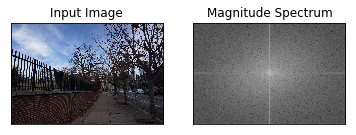

../data/trainsamples/Sony-NEX-7/(Nex7)6.JPG  :  45.4244898692  :  7.35058219519


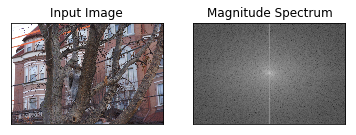

../data/trainsamples/Sony-NEX-7/(Nex7)7.JPG  :  39.1709428071  :  7.22094045335


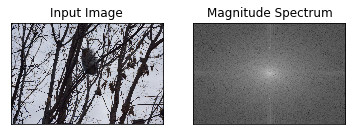

../data/trainsamples/Sony-NEX-7/(Nex7)8.JPG  :  67.3335863975  :  7.56234386979


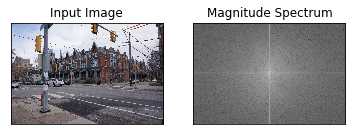

../data/trainsamples/Sony-NEX-7/(Nex7)9.JPG  :  211.316835626  :  7.74745642501


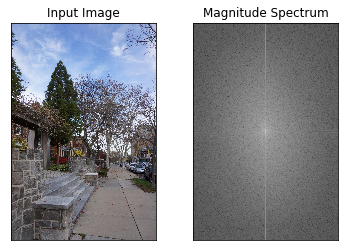

In [43]:
cameras = []
images = []
filenames = []
for img in train_images:
    im_path = '../data/trainsamples/'+img[0]+'/'+img[1]
    originalImage = cv2.imread(im_path)    
    image = cv2.cvtColor(originalImage, cv2.COLOR_BGR2RGB)
    fm = cv2.Laplacian(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cv2.CV_64F).var()    
    
    
    entropy=0
    temp = cv2.blur(image,(10,10))
    hist = np.bincount(temp.ravel(),minlength=256)+1
    hist=hist/float(np.sum(hist))
    entropy=np.sum(-hist*np.log2(hist))
    
    print(im_path, ' : ', fm, ' : ', entropy)    
    
    
    img_float32 = np.float32(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    plt.subplot(121),plt.imshow(image, cmap = 'gray')
    plt.title('Input Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
    plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
    plt.show() 


    #hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    #hist = cv2.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
    
    #plt.imshow(hist,interpolation = 'nearest')
    #plt.show()

    images.append(image)
    cameras.append(img[0])
    filenames.append(img[1])
    #plt.xlabel(img[0])
    #plt.imshow(image)
    #plt.show()